## 1. Initializing the Data

In [ ]:
!pip install lime shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 275 kB 4.4 MB/s 
     |████████████████████████████████| 569 kB 49.4 MB/s 
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283857 sha256=14f77c921d576c0970f43ea5fccba98794b24d19c926e8a335d0b4e8bc5757c4
  Stored in directory: /root/.cache/pip/wheels/ca/cb/e5/ac701e12d365a08917bf4c6171c0961bc880a8181359c66aa7
Successfully built lime


In [ ]:
#Import Dependencies
import pandas as pd
import numpy as np

# data visualization
import matplotlib.pyplot as plt
import seaborn as sns

# machine learning
from sklearn.preprocessing import StandardScaler

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict

from collections import Counter
from imblearn.over_sampling import RandomOverSampler

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

import lime
from lime import lime_tabular
import shap

from google.colab import files
%matplotlib inline

#Get file
files.upload()

Saving data.csv to data.csv


{'data.csv': b'"id","diagnosis","radius_mean","texture_mean","perimeter_mean","area_mean","smoothness_mean","compactness_mean","concavity_mean","concave points_mean","symmetry_mean","fractal_dimension_mean","radius_se","texture_se","perimeter_se","area_se","smoothness_se","compactness_se","concavity_se","concave points_se","symmetry_se","fractal_dimension_se","radius_worst","texture_worst","perimeter_worst","area_worst","smoothness_worst","compactness_worst","concavity_worst","concave points_worst","symmetry_worst","fractal_dimension_worst",\r\n842302,M,17.99,10.38,122.8,1001,0.1184,0.2776,0.3001,0.1471,0.2419,0.07871,1.095,0.9053,8.589,153.4,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,25.38,17.33,184.6,2019,0.1622,0.6656,0.7119,0.2654,0.4601,0.1189\r\n842517,M,20.57,17.77,132.9,1326,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,0.5435,0.7339,3.398,74.08,0.005225,0.01308,0.0186,0.0134,0.01389,0.003532,24.99,23.41,158.8,1956,0.1238,0.1866,0.2416,0.186,0.275,0.08902\r\n84300903,M,1

In [ ]:
df = pd.read_csv("/content/data.csv")
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


# 2. Data Exploration

## 2.1 Explore the Dataset

In [ ]:
# shape of the dataframe
df.shape

(569, 33)

In [ ]:
# concise summary of dataframe
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [ ]:
#Drop the NaN Values as they are unusable
df.drop(columns=['id','Unnamed: 32'],axis=1,inplace=True)
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
# descriptive statistics of data
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


**Mean Measurements:** radius , perimeter , area , concavity , concave points

**Characteristics:** texture , smoothness , compactness , symmetry , fractal_dimension

## 2.2 Visualize Dataset

### 2.2.1 Correlation 

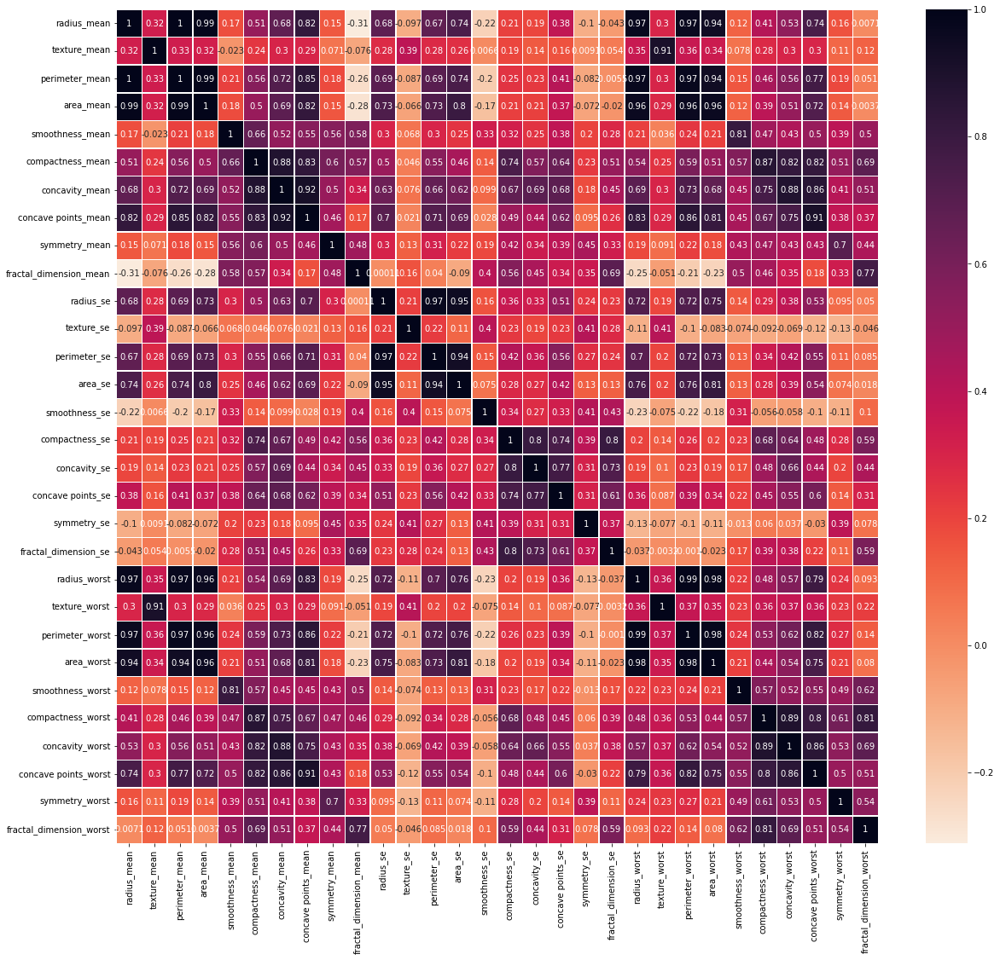

In [ ]:
plt.figure(figsize=(20,18))
sns.heatmap(df.corr(method='pearson'), annot=True,linewidths=.5, cmap="rocket_r")

Diagnosis is correlated with the radius, perimeter, area, and concave points.



In [ ]:
features_mean= list(df.columns[0:11])
features_se= list(df.columns[11:20])
features_worst=list(df.columns[21:31])

#add the diagnosis value
features_se.insert(0, df.columns[0])
features_worst.insert(0, df.columns[0])

### 2.2.2 Pairplot

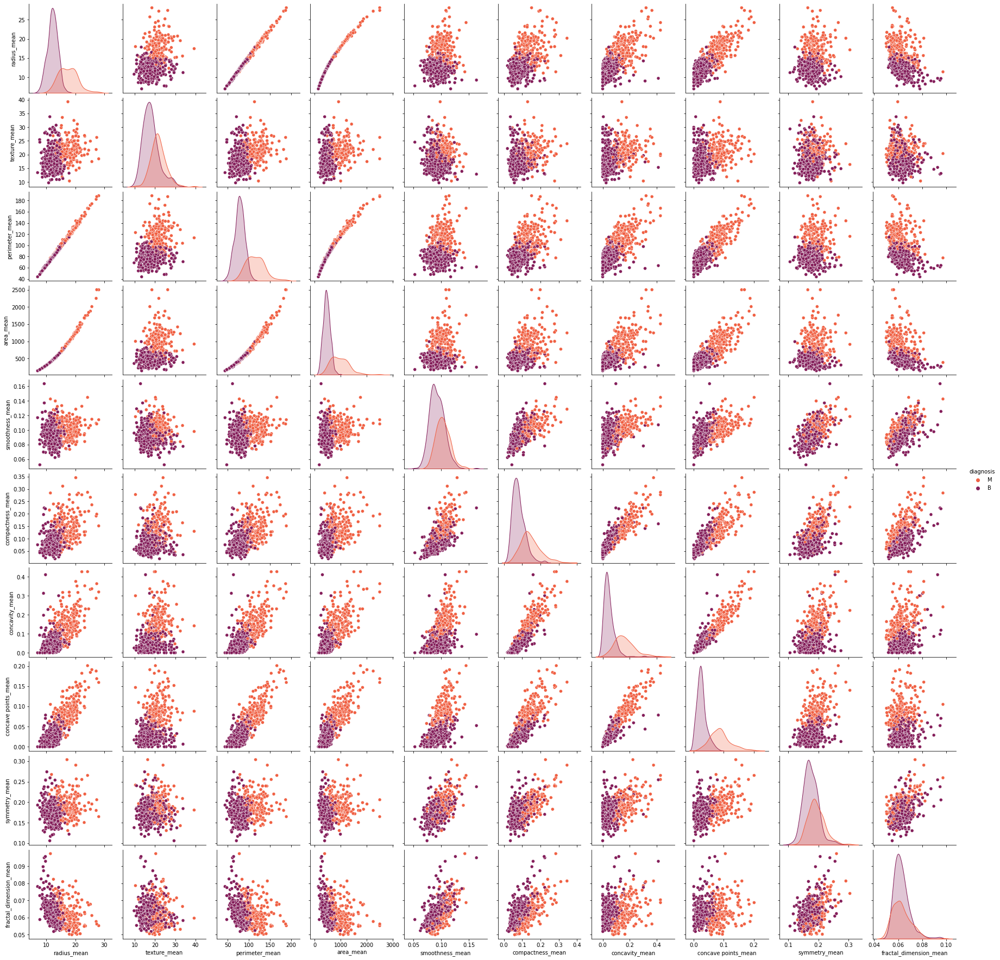

In [ ]:
# pairplot for mean columns
sns.pairplot(df[features_mean],hue = 'diagnosis', palette='rocket_r')

Radius is highly correlated with perimeter & area.

Compactness is correlated with concavity & concave points

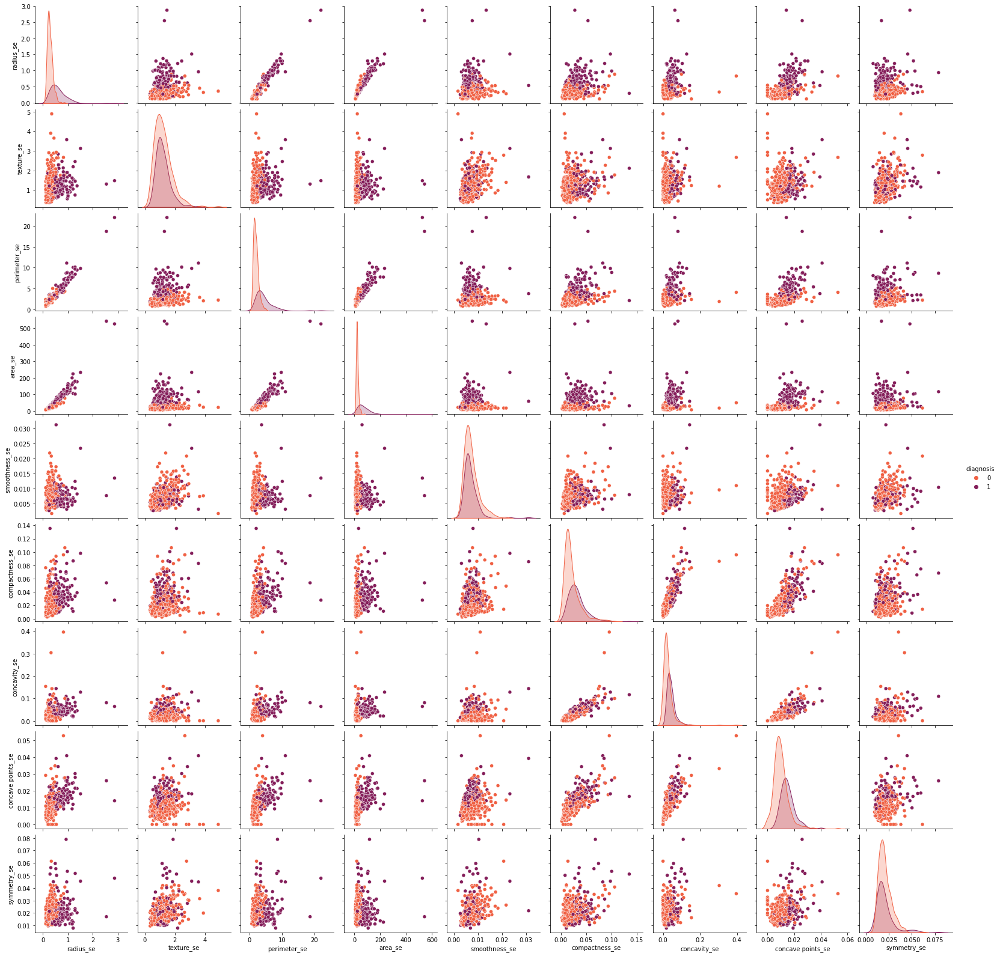

In [ ]:
# pairplot for se columns
sns.pairplot(df[features_se],hue = 'diagnosis', palette='rocket_r')

Radius is highly correlated with perimeter & area.

Compactness is correlated with concavity & concave points

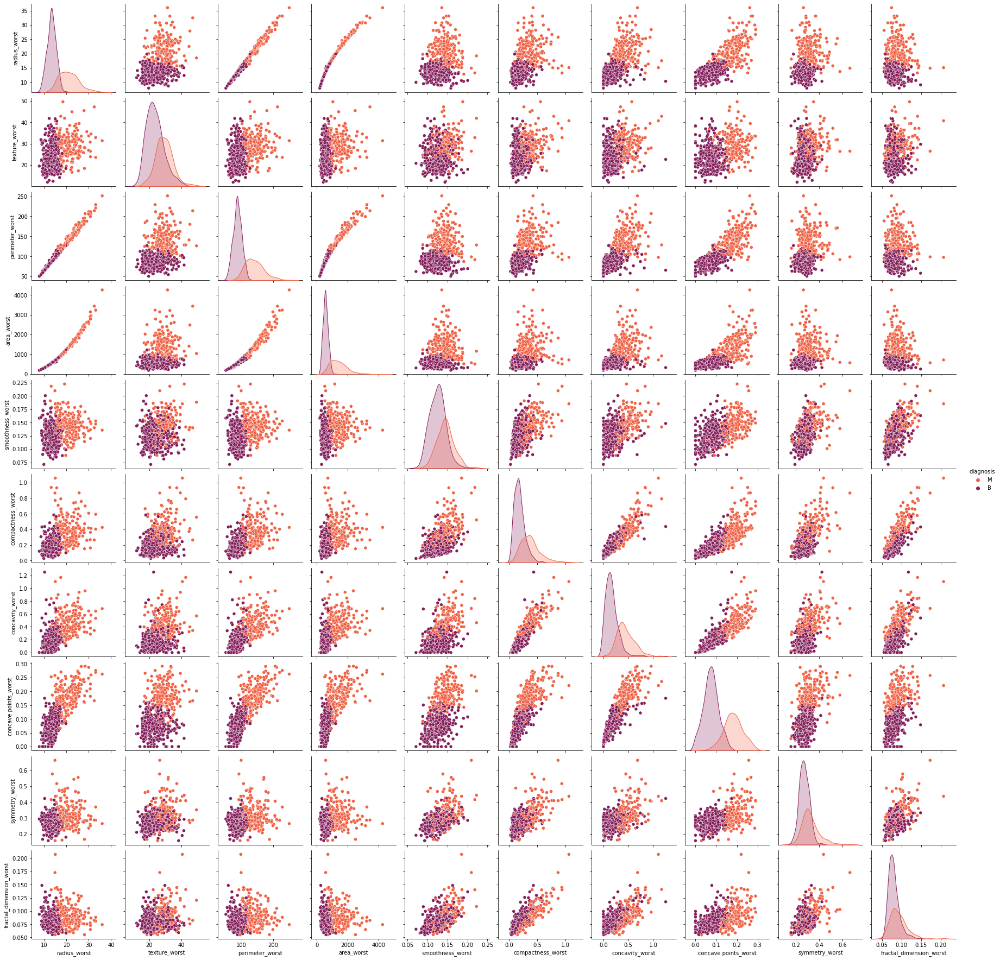

In [ ]:
# pairplot for worst columns
sns.pairplot(df[features_worst],hue = 'diagnosis', palette='rocket_r')

Radius is highly correlated with perimeter & area.

Compactness is correlated with concavity

# 4. Preprocessing

## 4.1 Tumor Classification


---

**Benign tumors** are those that stay in their primary location without invading other sites of the body.

**Malignant tumors** grow in an uncontrolled way and can invade nearby tissues and spread to other parts of the body through the blood and lymph system. 

Individuals with the malignant tumor are diagnosed with breast cancer.

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.


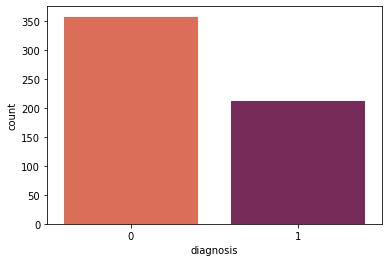

In [ ]:
df['diagnosis']=df['diagnosis'].map({'M':1,'B':0})
sns.countplot(df['diagnosis'],label="Count", palette='rocket_r')

## 4.2 Deleting Outliers

In [ ]:
#remove corrolated values
df.drop(columns=['perimeter_mean','area_mean','concavity_mean', 'concave points_mean', 'perimeter_se','area_se', 'concavity_se', 'concave points_se', 'perimeter_worst','area_worst','concavity_worst', 'concave points_worst'],axis=1,inplace=True)
df.head()

,diagnosis,radius_mean,texture_mean,smoothness_mean,compactness_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,smoothness_se,compactness_se,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,smoothness_worst,compactness_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,0.11840,0.27760,0.2419,0.07871,1.0950,0.9053,0.006399,0.04904,0.03003,0.006193,25.38,17.33,0.1622,0.6656,0.4601,0.11890
1,1,20.57,17.77,0.08474,0.07864,0.1812,0.05667,0.5435,0.7339,0.005225,0.01308,0.01389,0.003532,24.99,23.41,0.1238,0.1866,0.2750,0.08902
2,1,19.69,21.25,0.10960,0.15990,0.2069,0.05999,0.7456,0.7869,0.006150,0.04006,0.02250,0.004571,23.57,25.53,0.1444,0.4245,0.3613,0.08758
3,1,11.42,20.38,0.14250,0.28390,0.2597,0.09744,0.4956,1.1560,0.009110,0.07458,0.05963,0.009208,14.91,26.50,0.2098,0.8663,0.6638,0.17300
4,1,20.29,14.34,0.10030,0.13280,0.1809,0.05883,0.7572,0.7813,0.011490,0.02461,0.01756,0.005115,22.54,16.67,0.1374,0.2050,0.2364,0.07678


# 5. Training

In [ ]:
#split the data
y=df["diagnosis"]
X=df.drop(["diagnosis"],axis=1)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print(f"Training target statistics: {Counter(y_train)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 249, 1: 149})
Testing target statistics: Counter({0: 108, 1: 63})


In [ ]:
over_sampler = RandomOverSampler(random_state=42)
X_res, y_res = over_sampler.fit_resample(X_train, y_train)
print(f"Training target statistics: {Counter(y_res)}")
print(f"Testing target statistics: {Counter(y_test)}")

Training target statistics: Counter({0: 249, 1: 249})
Testing target statistics: Counter({0: 108, 1: 63})


In [ ]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X_train.columns,
    class_names=[0,1],
    mode='classification'
)

data_row = X_test.iloc[1]

balanced the data using the RandomOverSamplerPackage

In [ ]:
ss = StandardScaler()
X_train = ss.fit_transform(X_train)
X_test = ss.fit_transform(X_test)

## 5.1 with Logistic Regression

In [ ]:
logreg = LogisticRegression()
logreg_model = logreg.fit(X_train, y_train)
logreg_pred = logreg.predict(X_test)

In [ ]:
logreg_acc = accuracy_score(y_test, logreg_pred)
print("Accuracy of the Logistic Regression: ", logreg_acc)

Accuracy of the Logistic Regression:  0.9883040935672515


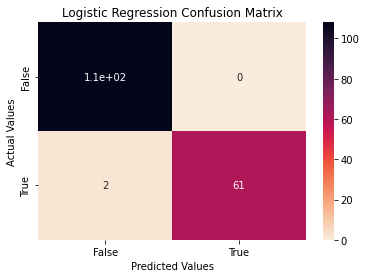

In [ ]:
logreg_cf_matrix = confusion_matrix(y_test, logreg_pred)

ax = sns.heatmap(logreg_cf_matrix, annot=True, cmap='rocket_r')

ax.set_title('Logistic Regression Confusion Matrix');
ax.set_xlabel('Predicted Values')
ax.set_ylabel('Actual Values');

ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

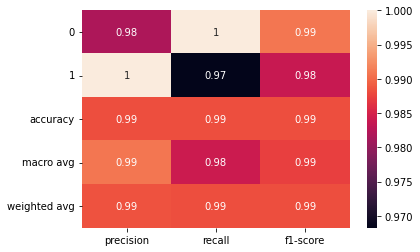

In [ ]:
logreg_classRep = classification_report(y_test, logreg_pred, labels=[0,1],
                                   target_names=[0,1],
                                   output_dict=True)

sns.heatmap(pd.DataFrame(logreg_classRep).iloc[:-1, :].T, annot=True)

In [ ]:
#check for overfitting
print('Accuracy on the training subset: {:.3f}'.format(logreg_model.score(X_train, y_train)))
print('Accuracy on the test subset: {:.3f}'.format(logreg_model.score(X_test, y_test)))

Accuracy on the training subset: 0.975
Accuracy on the test subset: 0.988


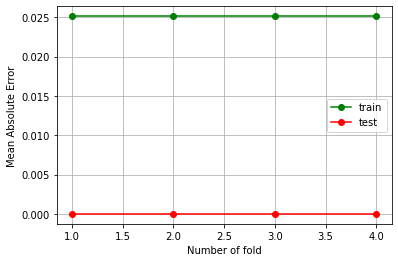

In [ ]:
#check for overfitting
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error

kf = KFold(n_splits=4)
mae_train = []
mae_test = []
for train_index, test_index in kf.split(X):
    
    y_train_pred = logreg.predict(X_train)
    y_test_pred = logreg.predict(X_test)
    mae_train.append(mean_absolute_error(y_train, y_train_pred))
    mae_test.append(mean_absolute_error(y_test, y_test_pred))

folds = range(1, kf.get_n_splits() + 1)
plt.plot(folds, mae_train, 'o-', color='green', label='train')
plt.plot(folds, mae_test, 'o-', color='red', label='test')
plt.legend()
plt.grid()
plt.xlabel('Number of fold')
plt.ylabel('Mean Absolute Error')
plt.show()

## 5.2 with SVM

In [ ]:
svc_model = SVC(kernel="rbf", probability=True)
svm_model = svc_model.fit(X_train, y_train)
svm_pred = svc_model.predict(X_test)

In [ ]:
svm_acc = accuracy_score(y_test, svm_pred)
print("Accuracy of SVM model is: ", svm_acc)

Accuracy of SVM model is:  0.9707602339181286


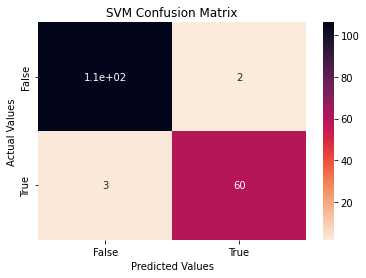

In [ ]:
svm_cf_matrix = confusion_matrix(y_test, svm_pred)

ax = sns.heatmap(svm_cf_matrix, annot=True, cmap='rocket_r')

ax.set_title('SVM Confusion Matrix');
ax.set_xlabel('Predicted Values')
ax.set_ylabel('Actual Values');

ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

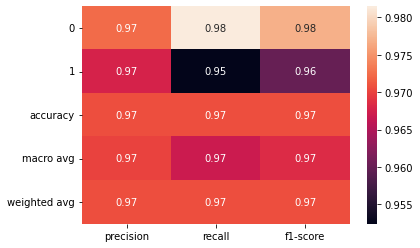

In [ ]:
svm_classRep = classification_report(y_test, svm_pred, labels=[0,1],
                                   target_names=[0,1],
                                   output_dict=True)

sns.heatmap(pd.DataFrame(svm_classRep).iloc[:-1, :].T, annot=True)

## 5.3 with Random Forest

In [ ]:
rfc = RandomForestClassifier(n_estimators=100)
rfc_model = rfc.fit(X_train, y_train)
rfc_pred = rfc.predict(X_test)

In [ ]:
rfc_acc = accuracy_score(y_test, rfc_pred)
print("Accuracy of Random Forests Model: ", rfc_acc)

Accuracy of Random Forests Model:  0.9707602339181286


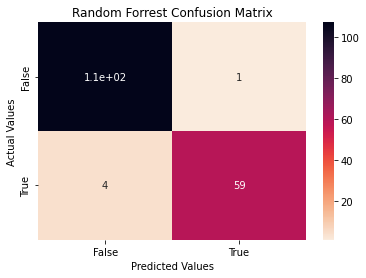

In [ ]:
rfc_cf_matrix = confusion_matrix(y_test, rfc_pred)

ax = sns.heatmap(rfc_cf_matrix, annot=True, cmap='rocket_r')

ax.set_title('Random Forrest Confusion Matrix');
ax.set_xlabel('Predicted Values')
ax.set_ylabel('Actual Values');

ax.xaxis.set_ticklabels(['False','True'])
ax.yaxis.set_ticklabels(['False','True'])

plt.show()

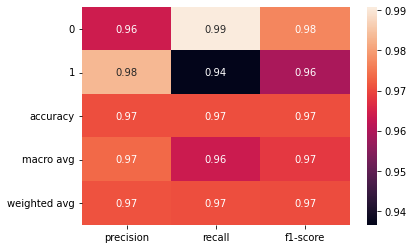

In [ ]:
rfc_classRep = classification_report(y_test, rfc_pred, labels=[0,1],
                                   target_names=[0,1],
                                   output_dict=True)

sns.heatmap(pd.DataFrame(rfc_classRep).iloc[:-1, :].T, annot=True)

# 6. Conclusion

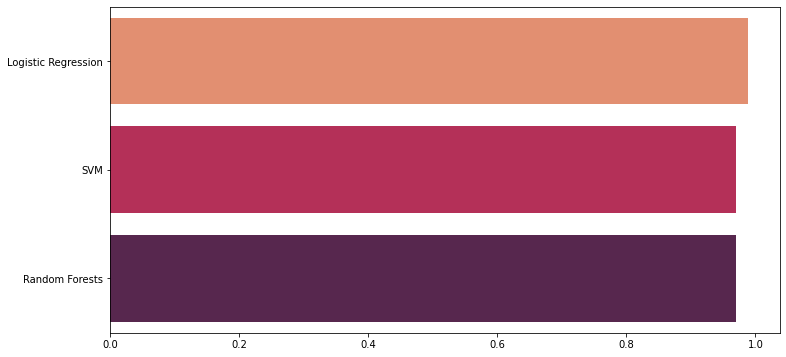

In [ ]:
plt.figure(figsize=(12,6))
model_acc = [logreg_acc, svm_acc, rfc_acc]
model_name = ['Logistic Regression', 'SVM', 'Random Forests']
sns.barplot(x= model_acc, y=model_name, palette='rocket_r')

In [ ]:
#logistic regression
exp = explainer.explain_instance(
    data_row=data_row, 
    predict_fn=logreg_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Permutation explainer: 570it [00:15, 17.51it/s]                         


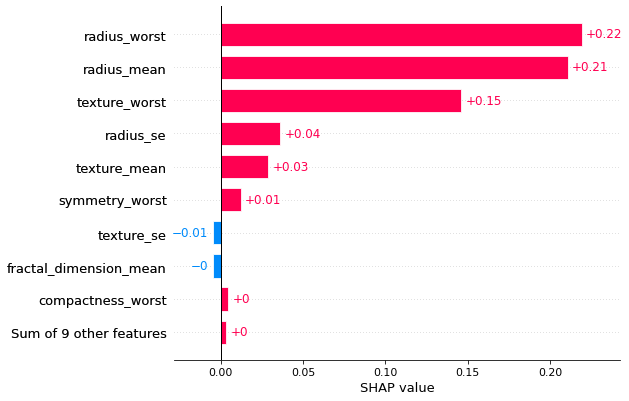

In [ ]:
logreg_explainer = shap.Explainer(logreg_model.predict, X_test)
logreg_shap_values = explainer(X)

shap.plots.bar(logreg_shap_values[0])

In [ ]:
#svm model
exp = explainer.explain_instance(
    data_row=data_row, 
    predict_fn=svm_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Permutation explainer: 570it [00:10,  1.37it/s]


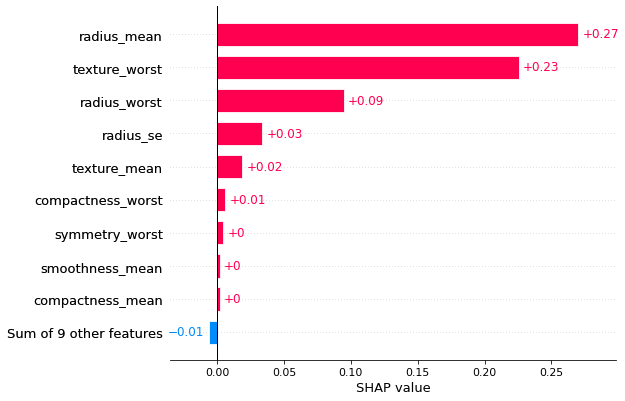

In [ ]:
svm_explainer = shap.Explainer(svm_model.predict, X_test)
svm_shap_values = explainer(X)

shap.plots.bar(svm_shap_values[0])

In [ ]:
exp = explainer.explain_instance(
    data_row=data_row, 
    predict_fn=rfc_model.predict_proba
)

exp.show_in_notebook(show_table=True)

Permutation explainer: 570it [00:20, 19.66it/s]                         


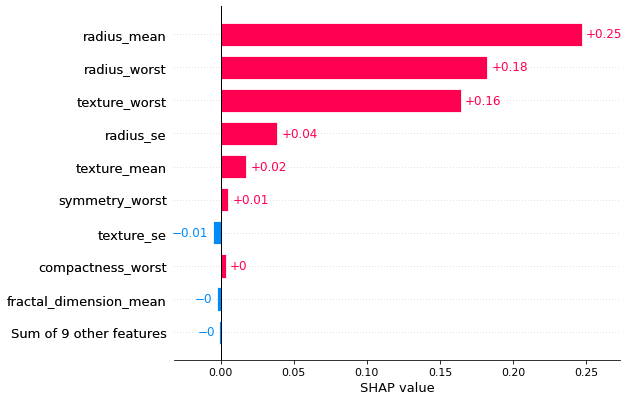

In [ ]:
rfc_explainer = shap.Explainer(rfc_model.predict, X_test)
rfc_shap_values = explainer(X)

shap.plots.bar(rfc_shap_values[0])